In [1]:
import os
import sys
import geopandas as gpd
import pandas as pd
import numpy as np
from scipy import stats
from scipy.stats import norm
from scipy.stats import pearsonr, spearmanr
from sklearn.feature_selection import mutual_info_regression
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import altair as alt
from mpl_toolkits.mplot3d import Axes3D
alt.data_transformers.enable("vegafusion")
from importlib import reload

In [2]:
sys.path.append("../../src")
import main
import vis

In [3]:
reload(vis)

<module 'vis' from '/Users/lisawink/Documents/freiburg/notebooks/visualisations/../../src/vis.py'>

In [4]:
temp =  pd.read_csv('/Users/lisawink/Documents/paper1/data/gap_filled_data_ta_rh.csv')
temp['datetime_UTC']=pd.to_datetime(temp['datetime_UTC'])
temp = temp[temp['variable']=='Ta_deg_C']
temp = temp[temp['data_type'] == 'observed']

In [4]:
temp = pd.read_csv('/Users/lisawink/Documents/paper1/data/raw_data/marvin_2024.csv')
temp['datetime']=pd.to_datetime(temp['datetime'])
temp['datetime_UTC'] = temp['datetime']
temp['value'] = temp['ta']

In [5]:
stations = pd.read_csv("/Users/lisawink/Documents/paper1/data/Freiburg-Street-Level-Weather-Station-Network-MetaData-V1-0.csv")

In [6]:
temp['month'] = temp['datetime_UTC'].dt.month

In [56]:
mean = temp['value'].mean()

In [57]:
mean

13.23016673801143

In [58]:
std = temp['value'].std()

In [59]:
std

7.959519443334034

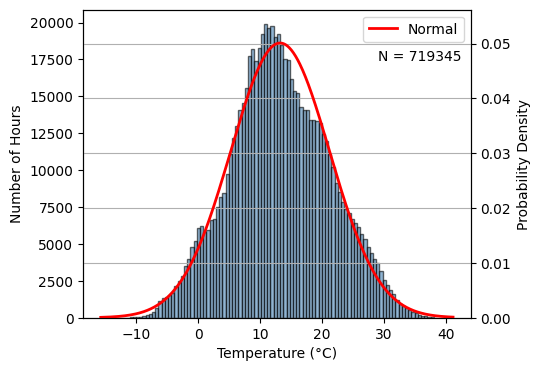

In [64]:
fig, ax = plt.subplots(figsize=(5, 4))
ax2 = ax.twinx()
# Histogram
ax.hist(temp['value'], bins=100, density=False, alpha=0.6, color='steelblue', edgecolor='black')
ax2.hist(temp['value'], bins=100, density=True, alpha=0.0, color='steelblue', edgecolor='black')

# Overlay normal distribution
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 500)
p = norm.pdf(x, mean, std)
ax2.plot(x, p, 'r', linewidth=2, label='Normal')

#put N in plot
n = len(temp['value'])
ax.text(0.76, 0.87, f'N = {n}', transform=ax.transAxes, fontsize=10, verticalalignment='top')

ax.set_xlabel("Temperature (°C)")
ax.set_ylabel("Number of Hours")
ax2.set_ylabel("Probability Density")
plt.legend()
plt.grid()
plt.savefig('/Users/lisawink/Documents/paper1/figures/fig6/temp_dist.png',bbox_inches='tight')
plt.savefig('/Users/lisawink/Documents/paper1/figures/fig6/temp_dist.svg',bbox_inches='tight')
plt.savefig('/Users/lisawink/Documents/paper1/figures/fig6/temp_dist.pdf',bbox_inches='tight')
plt.show()

In [16]:
stats.normaltest(temp['value'])

NormaltestResult(statistic=5116.621720991295, pvalue=0.0)

In [17]:
temp['value'].skew()

0.08318704805554195

In [15]:
temp

,datetime,station_id,ta,vp,datetime_UTC,value,month
0,2022-09-01 00:00:00+00:00,FRASHA,14.629891,1.441245,2022-09-01 00:00:00+00:00,14.629891,9
1,2022-09-01 00:00:00+00:00,FRBETZ,16.713000,1.459968,2022-09-01 00:00:00+00:00,16.713000,9
2,2022-09-01 00:00:00+00:00,FRBRUH,16.285000,1.484469,2022-09-01 00:00:00+00:00,16.285000,9
3,2022-09-01 00:00:00+00:00,FRDIET,13.840833,1.580545,2022-09-01 00:00:00+00:00,13.840833,9
4,2022-09-01 00:00:00+00:00,FRDREI,16.611667,1.495245,2022-09-01 00:00:00+00:00,16.611667,9
...,...,...,...,...,...,...,...
736885,2024-09-01 00:00:00+00:00,FRWEIN,21.804667,1.974577,2024-09-01 00:00:00+00:00,21.804667,9
736886,2024-09-01 00:00:00+00:00,FRWILD,19.727333,2.296735,2024-09-01 00:00:00+00:00,19.727333,9
736887,2024-09-01 00:00:00+00:00,FRWITT,22.871000,1.939729,2024-09-01 00:00:00+00:00,22.871000,9
736888,2024-09-01 00:00:00+00:00,FRWSEE,20.290667,2.013700,2024-09-01 00:00:00+00:00,20.290667,9


In [29]:
temp = temp[temp['station_id'] != 'FREICH']

temp['LCZ'] = temp['station_id'].map(stations.set_index('station_id')['local_climate_zone'])

temp_p=temp
temp_w = temp_p[temp_p['datetime_UTC'].dt.month.isin([12,1,2])]
temp_wn = temp_w[temp_w['datetime_UTC'].dt.hour.isin([0,1,2,3,4,20,21,22,23])]
temp_wd = temp_w[temp_w['datetime_UTC'].dt.hour.isin([10,11,12,13,14,15,16])]
temp_sp = temp_p[temp_p['datetime_UTC'].dt.month.isin([3,4,5])]
temp_spn = temp_sp[temp_sp['datetime_UTC'].dt.hour.isin([0,1,2,3,4,5,19,20,21,22,23])]
temp_spd = temp_sp[temp_sp['datetime_UTC'].dt.hour.isin([10,11,12,13,14,15,16])]
temp_s = temp_p[temp_p['datetime_UTC'].dt.month.isin([6,7,8])]
temp_sn = temp_s[temp_s['datetime_UTC'].dt.hour.isin([0,1,2,22,23])]
temp_sd = temp_s[temp_s['datetime_UTC'].dt.hour.isin([10,11,12,13,14,15,16])]
temp_a = temp_p[temp_p['datetime_UTC'].dt.month.isin([9,10,11])]
temp_an = temp_a[temp_a['datetime_UTC'].dt.hour.isin([0,1,2,3,4,5,21,22,23])]
temp_ad = temp_a[temp_a['datetime_UTC'].dt.hour.isin([9,10,11,12,13,14,15,16])]

temp_n = temp_p[temp_p['datetime_UTC'].dt.hour.isin([0,1,2,22,23])]



In [30]:
print(temp_p['value'].mean(), temp_p['value'].std())
print(temp_w['value'].mean(), temp_w['value'].std())
print(temp_sp['value'].mean(), temp_sp['value'].std())
print(temp_s['value'].mean(), temp_s['value'].std())
print(temp_a['value'].mean(), temp_a['value'].std())

13.23016673801143 7.959519443334034
5.472934453782441 5.3744714809003336
12.041363241211476 5.632572998077712
21.419810221759978 5.107890730995581
13.866858809498224 6.148390570030739


In [31]:
uhi = temp[temp['station_id']=='FRKART']['value'].values - temp[temp['station_id']=='FRHOCH']['value'].values

In [32]:
uhi_n = temp_n[temp_n['station_id']=='FRKART']['value'].values - temp_n[temp_n['station_id']=='FRHOCH']['value'].values

In [33]:
uhi_sn = temp_sn[temp_sn['station_id']=='FRKART']['value'].values - temp_sn[temp_sn['station_id']=='FRHOCH']['value'].values

In [34]:
np.median(uhi_sn), np.percentile(uhi_sn, 90)

(2.7732500049999986, 4.762849996999999)

In [37]:
uhi_wn = temp_wn[temp_wn['station_id']=='FRKART']['value'].values - temp_wn[temp_wn['station_id']=='FRHOCH']['value'].values

In [38]:
np.median(uhi_wn), np.percentile(uhi_wn, 90)

(1.0853333339999995, 3.8753000002)

(array([0.01194365, 0.        , 0.        , 0.        , 0.        ,
        0.00597182, 0.        , 0.        , 0.00597182, 0.        ,
        0.00597182, 0.        , 0.        , 0.        , 0.01194365,
        0.00597182, 0.01791547, 0.01194365, 0.01791547, 0.00597182,
        0.00597182, 0.03583094, 0.07166188, 0.05374641, 0.1552674 ,
        0.17915469, 0.47774584, 0.54343589, 0.53746407, 0.50163313,
        0.5971823 , 0.46580219, 0.43594308, 0.47774584, 0.32845026,
        0.35233756, 0.25081656, 0.2866475 , 0.2329011 , 0.19109833,
        0.17318287, 0.16123922, 0.14929557, 0.13735193, 0.12540828,
        0.11346464, 0.14929557, 0.10749281, 0.16123922, 0.10749281,
        0.11346464, 0.05971823, 0.0776337 , 0.08957734, 0.12540828,
        0.0776337 , 0.11346464, 0.06569005, 0.05374641, 0.10749281,
        0.14332375, 0.10749281, 0.05971823, 0.06569005, 0.05971823,
        0.06569005, 0.03583094, 0.07166188, 0.03583094, 0.02985911,
        0.02985911, 0.07166188, 0.03583094, 0.02

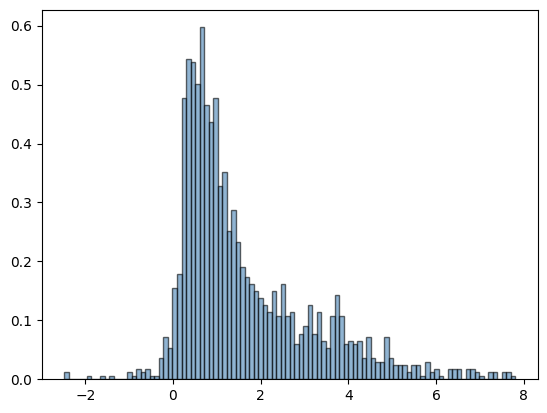

In [39]:
plt.hist(uhi_wn, bins=100, density=True, alpha=0.6, color='steelblue', edgecolor='black')

(array([0.06205566, 0.01551391, 0.03102783, 0.12411131, 0.07756957,
        0.09308348, 0.1085974 , 0.20168088, 0.20168088, 0.13962523,
        0.23270871, 0.15513914, 0.1085974 , 0.26373654, 0.24822262,
        0.09308348, 0.20168088, 0.17065305, 0.24822262, 0.23270871,
        0.21719479, 0.13962523, 0.24822262, 0.15513914, 0.12411131,
        0.24822262, 0.23270871, 0.20168088, 0.13962523, 0.13962523,
        0.24822262, 0.17065305, 0.23270871, 0.21719479, 0.20168088,
        0.17065305, 0.34130611, 0.29476436, 0.24822262, 0.31027828,
        0.23270871, 0.20168088, 0.18616697, 0.23270871, 0.17065305,
        0.31027828, 0.17065305, 0.21719479, 0.35682002, 0.23270871,
        0.23270871, 0.26373654, 0.26373654, 0.18616697, 0.20168088,
        0.26373654, 0.31027828, 0.12411131, 0.17065305, 0.13962523,
        0.17065305, 0.17065305, 0.12411131, 0.17065305, 0.12411131,
        0.1085974 , 0.07756957, 0.18616697, 0.15513914, 0.12411131,
        0.1085974 , 0.09308348, 0.03102783, 0.12

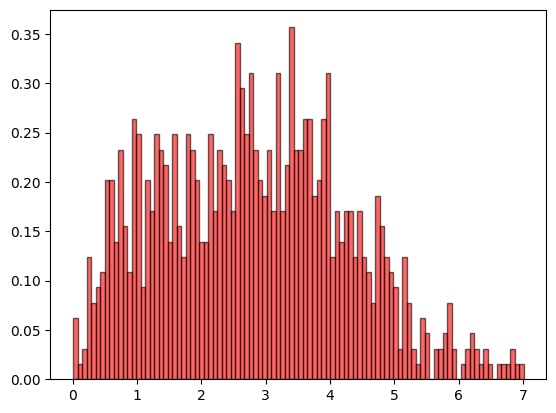

In [40]:
plt.hist(uhi_sn, bins=100, density=True, alpha=0.6, color='red', edgecolor='black')

In [42]:
print(np.median(uhi_n), np.percentile(uhi_n, 90))
print(np.median(uhi_wn), np.percentile(uhi_wn, 90))
print(np.median(uhi_sn), np.percentile(uhi_sn, 90))

1.956166668499999 4.6771666665
1.0853333339999995 3.8753000002
2.7732500049999986 4.762849996999999


In [48]:
mean_uhi = uhi_n.mean()
std_uhi = uhi_n.std()

In [43]:
np.median(uhi_n), np.percentile(uhi_n, 90)

(1.956166668499999, 4.6771666665)

In [54]:
uhi_n

array([3.28266667, 3.42266667, 3.361     , ..., 2.7595    , 4.3045    ,
       4.677     ])

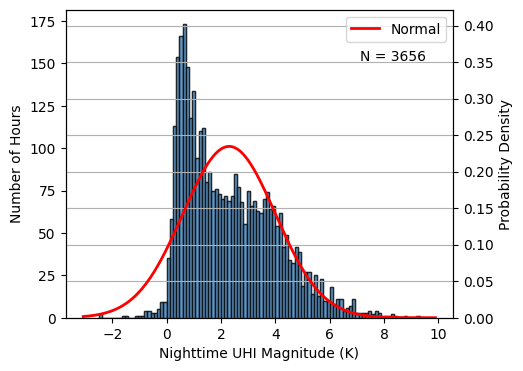

In [63]:
fig, ax = plt.subplots(figsize=(5, 4))
ax2 = ax.twinx()
ax.hist(uhi_n, bins=100, density=False, alpha=0.6, color='steelblue', edgecolor='black')
ax2.hist(uhi_n, bins=100, density=True, alpha=0.6, color='steelblue', edgecolor='black')
# Histogram

# Overlay normal distribution
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 500)
p = norm.pdf(x, mean_uhi, std_uhi)
plt.plot(x, p, 'r', linewidth=2, label='Normal')

n = len(uhi_n)
ax.text(0.76, 0.87, f'N = {n}', transform=ax.transAxes, fontsize=10, verticalalignment='top')

ax.set_xlabel("Nighttime UHI Magnitude (K)")
ax.set_ylabel("Number of Hours")
ax2.set_ylabel("Probability Density")

plt.legend()
plt.grid(True)
plt.savefig('/Users/lisawink/Documents/paper1/figures/fig6/uhi_dist.png',bbox_inches='tight')
plt.savefig('/Users/lisawink/Documents/paper1/figures/fig6/uhi_dist.svg',bbox_inches='tight')
plt.savefig('/Users/lisawink/Documents/paper1/figures/fig6/uhi_dist.pdf',bbox_inches='tight')
plt.show()

In [148]:
temp_s[temp_s['LCZ'].isin(['2 (Compact midrise)','4 (Open highrise)','5 (Open midrise)','6 (Open lowrise)', '8 (Large lowrise)'])]['value'].mean()

21.960551889233955

In [149]:
temp_s[temp_s['LCZ'].isin(['2 (Compact midrise)'])]['value'].mean()

22.756752717391304

<Axes: >

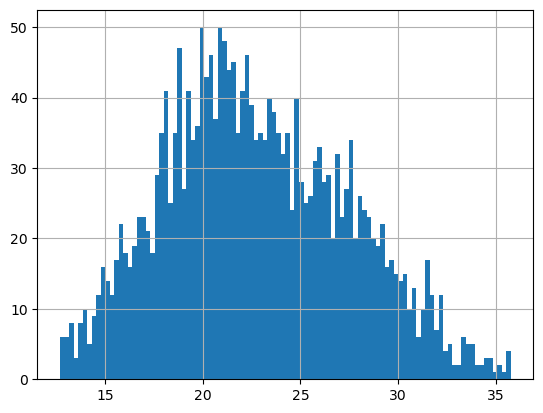

In [150]:
temp_s[temp_s['LCZ'].isin(['2 (Compact midrise)'])]['value'].hist(bins=100)

In [173]:
temp_w['datetime_UTC'] = temp_w['datetime_UTC'].astype(str)
temp_wn['datetime_UTC'] = temp_wn['datetime_UTC'].astype(str)
temp_sp['datetime_UTC'] = temp_sp['datetime_UTC'].astype(str)
temp_s['datetime_UTC'] = temp_s['datetime_UTC'].astype(str)
temp_a['datetime_UTC'] = temp_a['datetime_UTC'].astype(str)
temp_n['datetime_UTC'] = temp_n['datetime_UTC'].astype(str)

temp_w = temp_w.pivot(index='station_id', columns='datetime_UTC', values='value')
temp_wn = temp_wn.pivot(index='station_id', columns='datetime_UTC', values='value')
temp_sp = temp_sp.pivot(index='station_id', columns='datetime_UTC', values='value')
temp_s = temp_s.pivot(index='station_id', columns='datetime_UTC', values='value')
temp_a = temp_a.pivot(index='station_id', columns='datetime_UTC', values='value')
temp_n = temp_n.pivot(index='station_id', columns='datetime_UTC', values='value')

temp['datetime_UTC'] = temp['datetime_UTC'].astype(str)
temp = temp.pivot(index='station_id', columns='datetime_UTC', values='value')

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_41166/628163603.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_w['datetime_UTC'] = temp_w['datetime_UTC'].astype(str)
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_41166/628163603.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_wn['datetime_UTC'] = temp_wn['datetime_UTC'].astype(str)
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_41166/628163603.py:3: SettingWithCopyWarning: 
A value is trying to be set on

In [174]:
hid = temp.loc[:, temp.std() > 2].columns.values
hiw = temp_w.loc[:, temp_w.std() > 2].columns.values
hiwn = temp_wn.loc[:, temp_wn.std() > 2].columns.values
his = temp_s.loc[:, temp_s.std() > 2].columns.values
hia = temp_a.loc[:, temp_a.std() > 2].columns.values
hisp = temp_sp.loc[:, temp_sp.std() > 2].columns.values

hin = temp_n.loc[:, temp_n.std() > 2].columns.values

In [175]:
len(hid)

112

In [176]:
len(pd.DataFrame(pd.to_datetime(hid),columns=['datetime_UTC'])['datetime_UTC'].dt.date.unique())

30

In [177]:
len(pd.DataFrame(pd.to_datetime(hin),columns=['datetime_UTC'])['datetime_UTC'].dt.date.unique())

22

Pearson ρ: 0.60
$r^2$: 0.356
RMSE: 1.654
Spearman ρ: 0.59
Spearman p-val: 0.00
Max. Cook's D: 0.012
Pearson ρ: 0.61
$r^2$: 0.375
RMSE: 1.630
Spearman ρ: 0.63
Spearman p-val: 0.00
Max. Cook's D: 0.013
Pearson ρ: 0.63
$r^2$: 0.394
RMSE: 1.606
Spearman ρ: 0.62
Spearman p-val: 0.00
Max. Cook's D: 0.012
Pearson ρ: -0.48
$r^2$: 0.232
RMSE: 1.754
Spearman ρ: -0.52
Spearman p-val: 0.00
Max. Cook's D: 0.041
Pearson ρ: -0.67
$r^2$: 0.450
RMSE: 1.484
Spearman ρ: -0.69
Spearman p-val: 0.00
Max. Cook's D: 0.026
Pearson ρ: 0.52
$r^2$: 0.275
RMSE: 1.757
Spearman ρ: 0.59
Spearman p-val: 0.00
Max. Cook's D: 0.019
Pearson ρ: 0.60
$r^2$: 0.357
RMSE: 1.654
Spearman ρ: 0.66
Spearman p-val: 0.00
Max. Cook's D: 0.025
Pearson ρ: 0.66
$r^2$: 0.429
RMSE: 1.481
Spearman ρ: 0.68
Spearman p-val: 0.00
Max. Cook's D: 0.021
Pearson ρ: -0.61
$r^2$: 0.369
RMSE: 1.666
Spearman ρ: -0.59
Spearman p-val: 0.00
Max. Cook's D: 0.012
Pearson ρ: -0.46
$r^2$: 0.210
RMSE: 1.833
Spearman ρ: -0.42
Spearman p-val: 0.00
Max. Cook's D

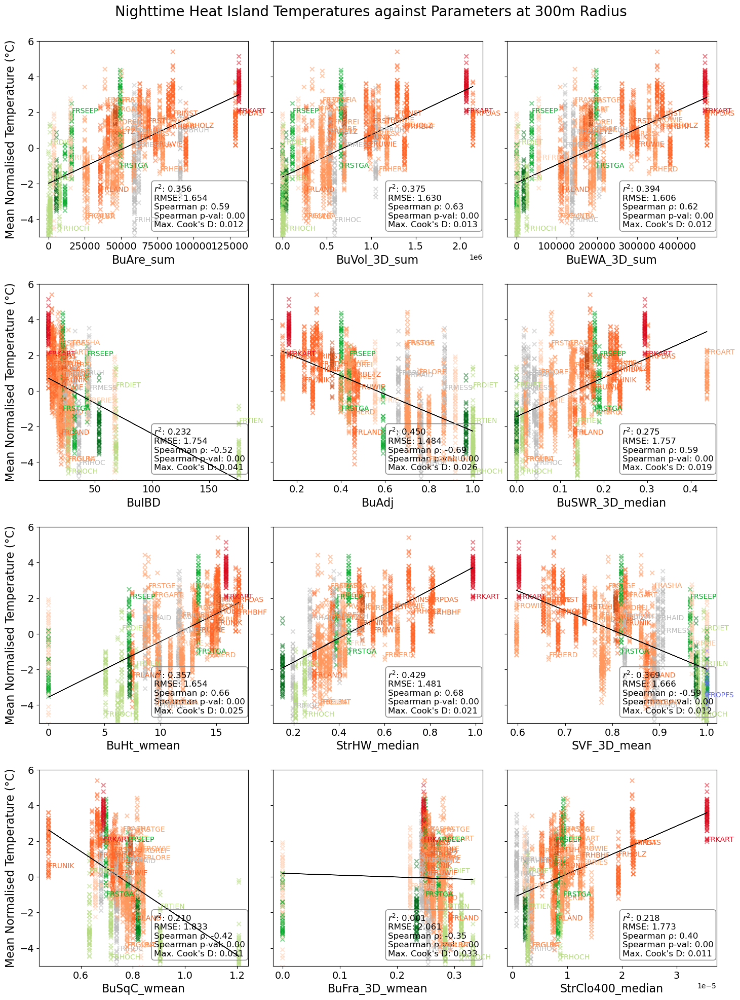

In [178]:
# mean normalisation

# make 3 by 4 plot with the following parameters
params = ['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuSqC_wmean','BuFra_3D_wmean', 'StrClo400_median']

fig, axs = plt.subplots(4, 3, figsize=(15, 20))
fig.suptitle('Nighttime Heat Island Temperatures against Parameters at 300m Radius', fontsize=20, y=0.99)
#fig.subplots_adjust(wspace=0.1)
for i, ax in enumerate(axs.flat):
    vis.simple_plot(ax, 300, params[i], hin)
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_ylabel("Mean Normalised Temperature (°C)", fontsize=16)
    ax.set_ylim(-5,6)

    if i % 3 != 0:  # 1st column (index 0, 3, 6, ...) keeps labels
        ax.set_ylabel("")  # Remove y-axis label
        ax.yaxis.set_ticklabels([])  # Remove y-axis ticks
        
plt.tight_layout(pad = 2, w_pad=0.01)
plt.savefig('/Users/lisawink/Documents/paper1/figures/hin_vs_params_300m_sd.png')
plt.savefig('/Users/lisawink/Documents/paper1/figures/hin_vs_params_300m_sd.pdf')
plt.show()

Pearson ρ: 0.35
$r^2$: 0.125
RMSE: 1.649
Spearman ρ: 0.31
Spearman p-val: 0.00
Max. Cook's D: 0.004
Pearson ρ: 0.42
$r^2$: 0.180
RMSE: 1.596
Spearman ρ: 0.40
Spearman p-val: 0.00
Max. Cook's D: 0.004
Pearson ρ: 0.39
$r^2$: 0.150
RMSE: 1.625
Spearman ρ: 0.38
Spearman p-val: 0.00
Max. Cook's D: 0.003
Pearson ρ: -0.29
$r^2$: 0.086
RMSE: 1.685
Spearman ρ: -0.29
Spearman p-val: 0.00
Max. Cook's D: 0.003
Pearson ρ: -0.46
$r^2$: 0.209
RMSE: 1.567
Spearman ρ: -0.49
Spearman p-val: 0.00
Max. Cook's D: 0.010
Pearson ρ: 0.43
$r^2$: 0.184
RMSE: 1.592
Spearman ρ: 0.47
Spearman p-val: 0.00
Max. Cook's D: 0.008
Pearson ρ: 0.41
$r^2$: 0.170
RMSE: 1.606
Spearman ρ: 0.45
Spearman p-val: 0.00
Max. Cook's D: 0.004
Pearson ρ: 0.52
$r^2$: 0.271
RMSE: 1.524
Spearman ρ: 0.53
Spearman p-val: 0.00
Max. Cook's D: 0.006
Pearson ρ: -0.31
$r^2$: 0.096
RMSE: 1.675
Spearman ρ: -0.33
Spearman p-val: 0.00
Max. Cook's D: 0.004
Pearson ρ: -0.36
$r^2$: 0.132
RMSE: 1.642
Spearman ρ: -0.43
Spearman p-val: 0.00
Max. Cook's D

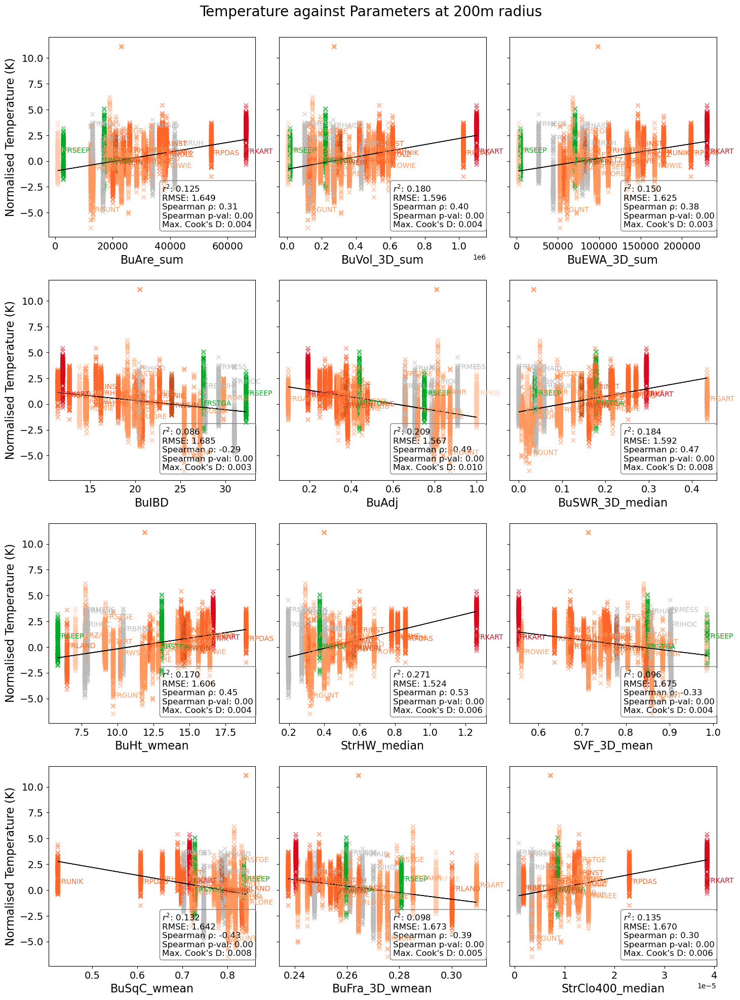

In [83]:
# mean normalisation

# make 3 by 4 plot with the following parameters
params = ['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuSqC_wmean','BuFra_3D_wmean', 'StrClo400_median']

fig, axs = plt.subplots(4, 3, figsize=(15, 20))
fig.suptitle('Temperature against Parameters at 200m radius', fontsize=20, y=0.99)
#fig.subplots_adjust(wspace=0.1)
for i, ax in enumerate(axs.flat):
    vis.simple_plot(ax, 200, params[i], hid)
    ax.tick_params(axis='both', which='major', labelsize=14)

    if i % 3 != 0:  # 1st column (index 0, 3, 6, ...) keeps labels
        ax.set_ylabel("")  # Remove y-axis label
        ax.yaxis.set_ticklabels([])  # Remove y-axis ticks
        
plt.tight_layout(pad = 2, w_pad=0.01)

/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1142: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1162: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/skle

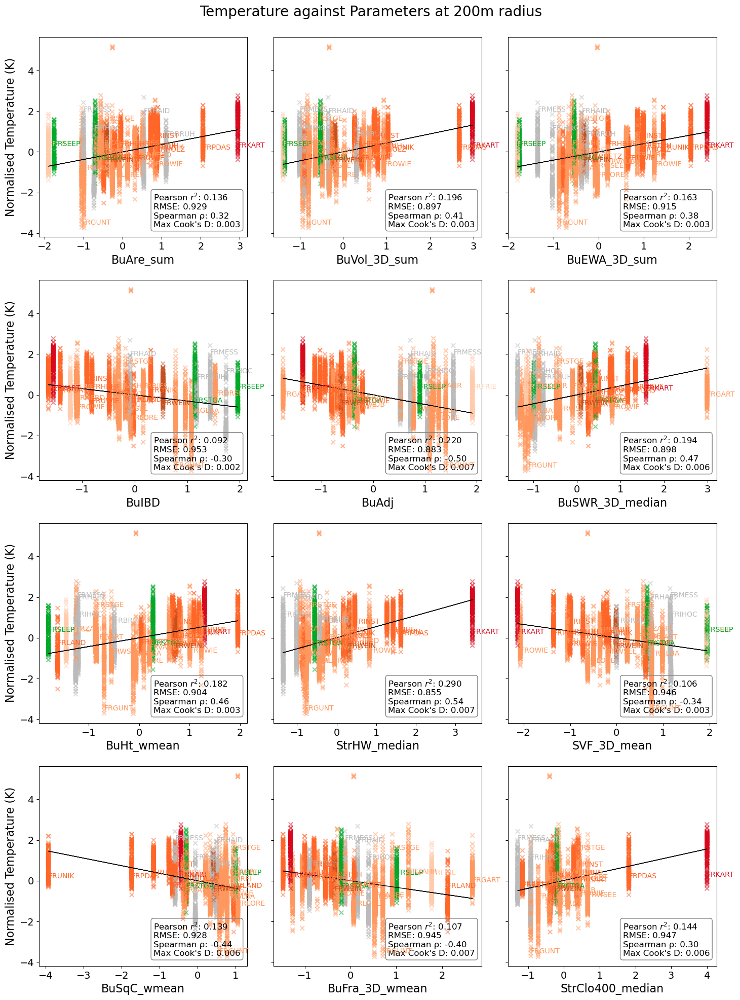

In [31]:
# make 3 by 4 plot with the following parameters
params = ['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuSqC_wmean','BuFra_3D_wmean', 'StrClo400_median']

fig, axs = plt.subplots(4, 3, figsize=(15, 20))
fig.suptitle('Temperature against Parameters at 200m radius', fontsize=20, y=0.99)
#fig.subplots_adjust(wspace=0.1)
for i, ax in enumerate(axs.flat):
    vis.simple_plot(ax, 200, params[i], hid)
    ax.tick_params(axis='both', which='major', labelsize=14)

    if i % 3 != 0:  # 1st column (index 0, 3, 6, ...) keeps labels
        ax.set_ylabel("")  # Remove y-axis label
        ax.yaxis.set_ticklabels([])  # Remove y-axis ticks
        
plt.tight_layout(pad = 2, w_pad=0.01)

/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1142: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1162: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/skle

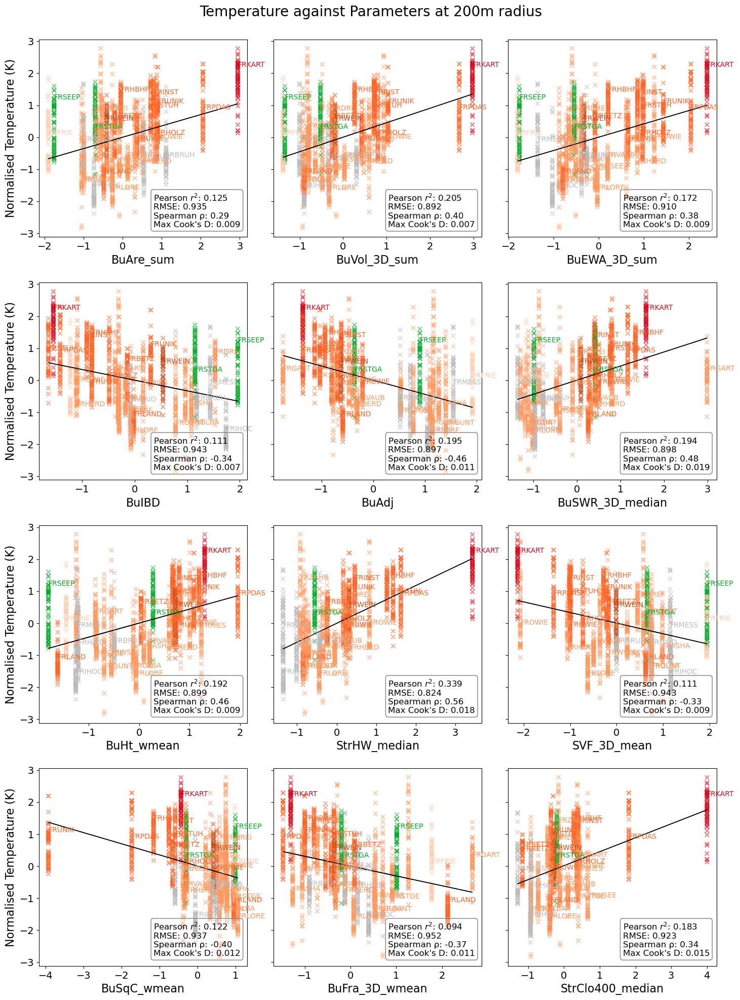

In [51]:
# make 3 by 4 plot with the following parameters
params = ['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuSqC_wmean','BuFra_3D_wmean', 'StrClo400_median']

fig, axs = plt.subplots(4, 3, figsize=(15, 20))
fig.suptitle('Temperature against Parameters at 200m radius', fontsize=20, y=0.99)
#fig.subplots_adjust(wspace=0.1)
for i, ax in enumerate(axs.flat):
    vis.simple_plot(ax, 200, params[i], hiw)
    ax.tick_params(axis='both', which='major', labelsize=14)

    if i % 3 != 0:  # 1st column (index 0, 3, 6, ...) keeps labels
        ax.set_ylabel("")  # Remove y-axis label
        ax.yaxis.set_ticklabels([])  # Remove y-axis ticks
        
plt.tight_layout(pad = 2, w_pad=0.01)

/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1142: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1162: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/skle

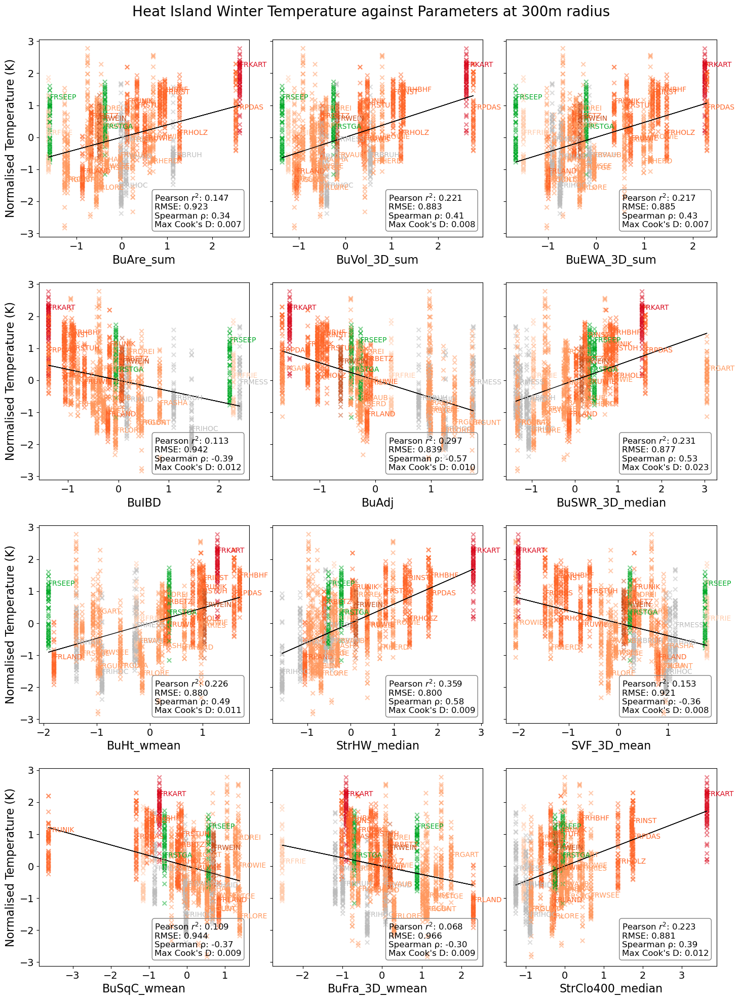

In [57]:
# make 3 by 4 plot with the following parameters
params = ['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuSqC_wmean','BuFra_3D_wmean', 'StrClo400_median']

fig, axs = plt.subplots(4, 3, figsize=(15, 20))
fig.suptitle('Heat Island Winter Temperature against Parameters at 300m radius', fontsize=20, y=0.99)
#fig.subplots_adjust(wspace=0.1)
for i, ax in enumerate(axs.flat):
    vis.simple_plot(ax, 300, params[i], hiw)
    ax.tick_params(axis='both', which='major', labelsize=14)

    if i % 3 != 0:  # 1st column (index 0, 3, 6, ...) keeps labels
        ax.set_ylabel("")  # Remove y-axis label
        ax.yaxis.set_ticklabels([])  # Remove y-axis ticks
        
plt.tight_layout(pad = 2, w_pad=0.01)

/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1142: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1162: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/skle

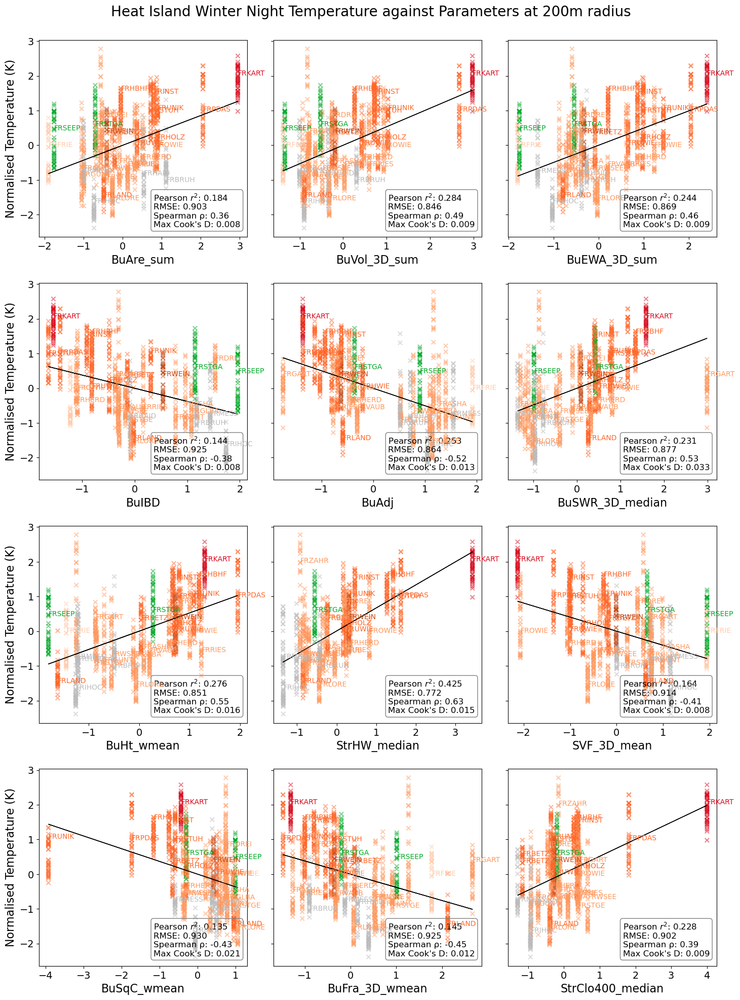

In [62]:
# make 3 by 4 plot with the following parameters
params = ['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuSqC_wmean','BuFra_3D_wmean', 'StrClo400_median']

fig, axs = plt.subplots(4, 3, figsize=(15, 20))
fig.suptitle('Heat Island Winter Night Temperature against Parameters at 200m radius', fontsize=20, y=0.99)
#fig.subplots_adjust(wspace=0.1)
for i, ax in enumerate(axs.flat):
    vis.simple_plot(ax, 200, params[i], hiwn)
    ax.tick_params(axis='both', which='major', labelsize=14)

    if i % 3 != 0:  # 1st column (index 0, 3, 6, ...) keeps labels
        ax.set_ylabel("")  # Remove y-axis label
        ax.yaxis.set_ticklabels([])  # Remove y-axis ticks
        
plt.tight_layout(pad = 2, w_pad=0.01)

/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1142: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1162: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/skle

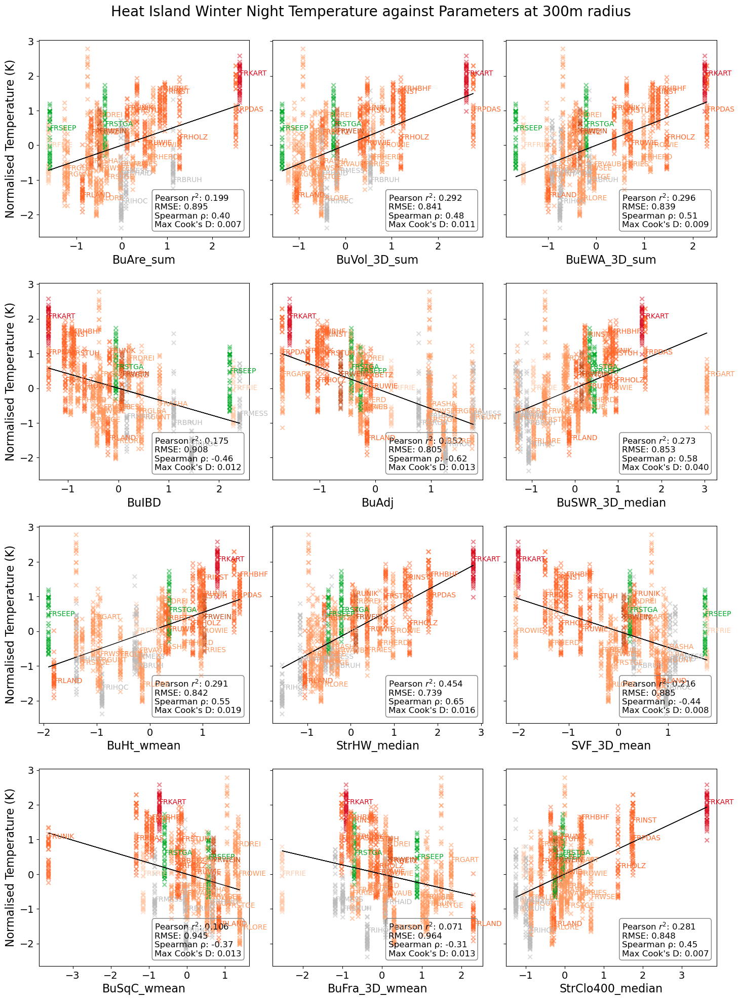

In [61]:
# make 3 by 4 plot with the following parameters
params = ['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuSqC_wmean','BuFra_3D_wmean', 'StrClo400_median']

fig, axs = plt.subplots(4, 3, figsize=(15, 20))
fig.suptitle('Heat Island Winter Night Temperature against Parameters at 300m radius', fontsize=20, y=0.99)
#fig.subplots_adjust(wspace=0.1)
for i, ax in enumerate(axs.flat):
    vis.simple_plot(ax, 300, params[i], hiwn)
    ax.tick_params(axis='both', which='major', labelsize=14)

    if i % 3 != 0:  # 1st column (index 0, 3, 6, ...) keeps labels
        ax.set_ylabel("")  # Remove y-axis label
        ax.yaxis.set_ticklabels([])  # Remove y-axis ticks
        
plt.tight_layout(pad = 2, w_pad=0.01)

/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1142: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1162: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/skle

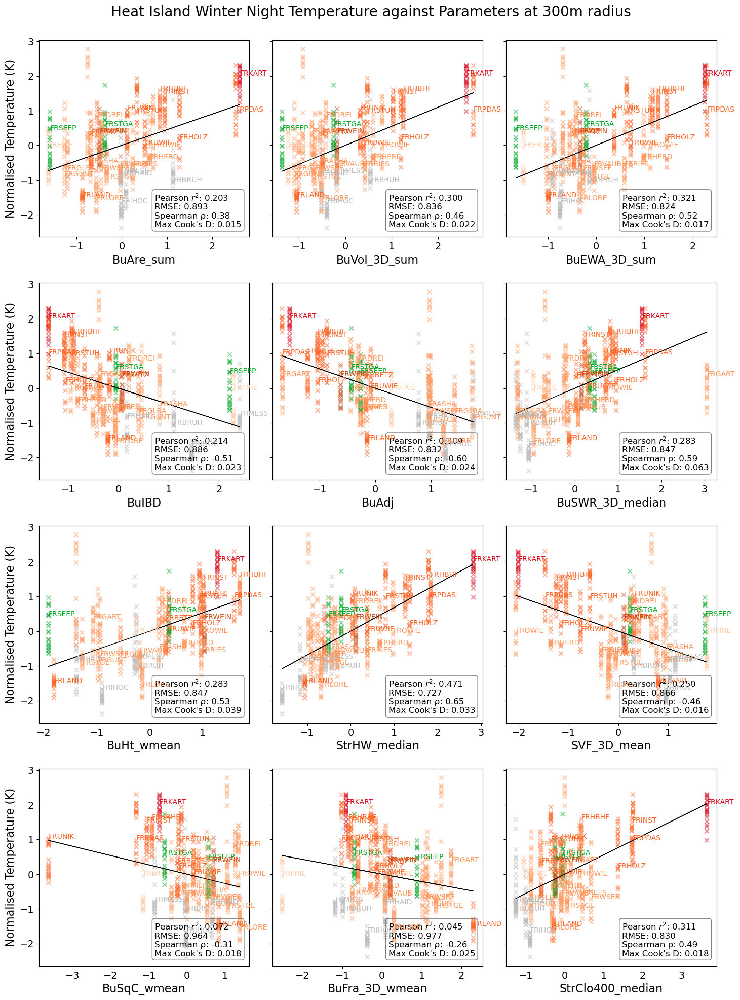

In [70]:
### SD > 2.3 instead of 2

# make 3 by 4 plot with the following parameters
params = ['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuSqC_wmean','BuFra_3D_wmean', 'StrClo400_median']

fig, axs = plt.subplots(4, 3, figsize=(15, 20))
fig.suptitle('Heat Island Winter Night Temperature against Parameters at 300m radius', fontsize=20, y=0.99)
#fig.subplots_adjust(wspace=0.1)
for i, ax in enumerate(axs.flat):
    vis.simple_plot(ax, 300, params[i], hiwn)
    ax.tick_params(axis='both', which='major', labelsize=14)

    if i % 3 != 0:  # 1st column (index 0, 3, 6, ...) keeps labels
        ax.set_ylabel("")  # Remove y-axis label
        ax.yaxis.set_ticklabels([])  # Remove y-axis ticks
        
plt.tight_layout(pad = 2, w_pad=0.01)

/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1142: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1162: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/skle

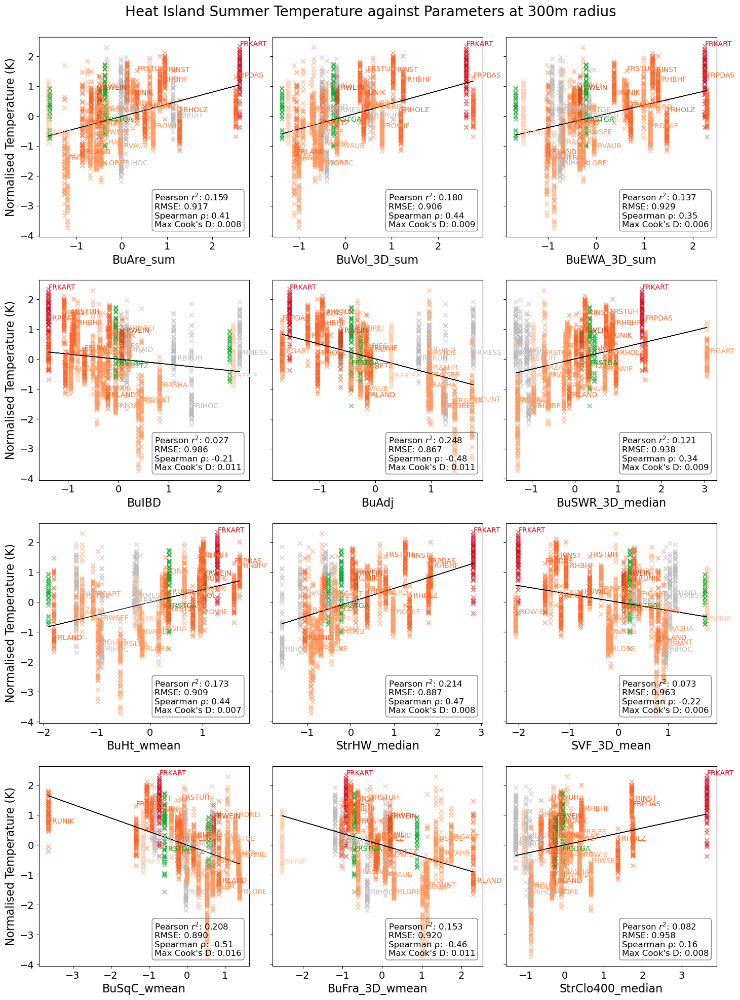

In [63]:
# make 3 by 4 plot with the following parameters
params = ['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuSqC_wmean','BuFra_3D_wmean', 'StrClo400_median']

fig, axs = plt.subplots(4, 3, figsize=(15, 20))
fig.suptitle('Heat Island Summer Temperature against Parameters at 300m radius', fontsize=20, y=0.99)
#fig.subplots_adjust(wspace=0.1)
for i, ax in enumerate(axs.flat):
    vis.simple_plot(ax, 300, params[i], his)
    ax.tick_params(axis='both', which='major', labelsize=14)

    if i % 3 != 0:  # 1st column (index 0, 3, 6, ...) keeps labels
        ax.set_ylabel("")  # Remove y-axis label
        ax.yaxis.set_ticklabels([])  # Remove y-axis ticks
        
plt.tight_layout(pad = 2, w_pad=0.01)

/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1142: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1162: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/skle

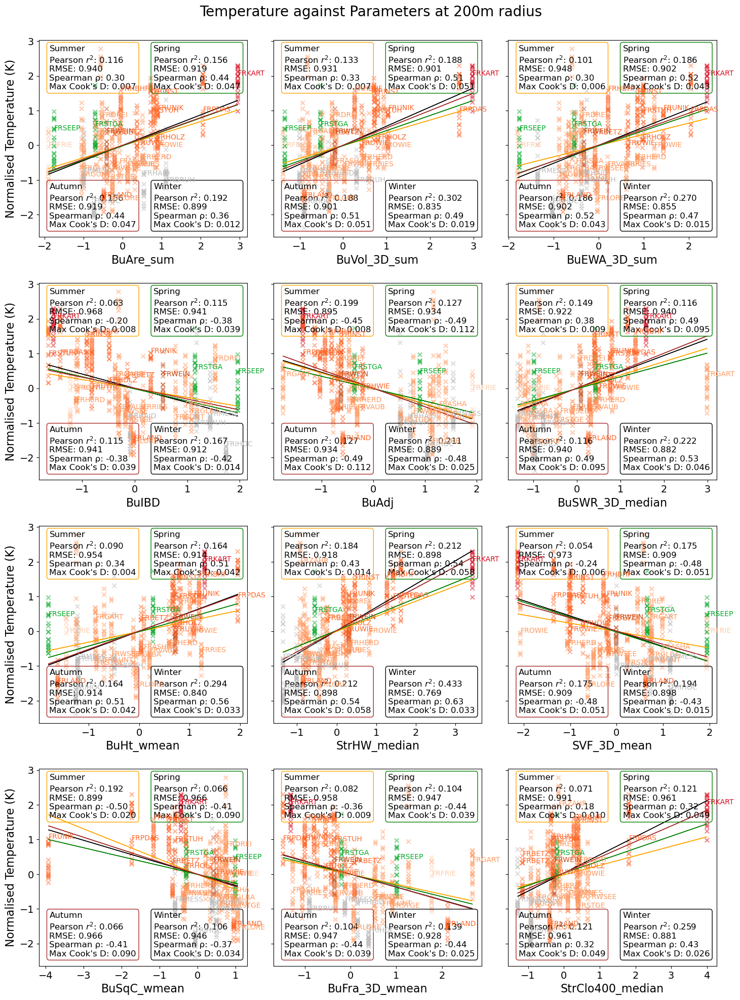

In [74]:
# make 3 by 4 plot with the following parameters
params = ['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuSqC_wmean','BuFra_3D_wmean', 'StrClo400_median']

fig, axs = plt.subplots(4, 3, figsize=(15, 20))
fig.suptitle('Temperature against Parameters at 200m radius', fontsize=20, y=0.99)
#fig.subplots_adjust(wspace=0.1)
for i, ax in enumerate(axs.flat):
    vis.plot_seasons(ax, 200, params[i], hiwn, hisp, his, hia)
    ax.tick_params(axis='both', which='major', labelsize=14)

    if i % 3 != 0:  # 1st column (index 0, 3, 6, ...) keeps labels
        ax.set_ylabel("")  # Remove y-axis label
        ax.yaxis.set_ticklabels([])  # Remove y-axis ticks
        
plt.tight_layout(pad = 2, w_pad=0.01)
#plt.savefig('/Users/lisawink/Documents/paper1/figures/seasons_temp_vs_params_200m_new1.png')
#plt.savefig('/Users/lisawink/Documents/paper1/figures/seasons_temp_vs_params_200m_new1.pdf')
plt.show()